In [1]:
from zs6d import ZS6D
import os
import json


# Loading the config file:
with open(os.path.join("./zs6d_configs/bop_eval_configs/cfg_ycbv_inference_bop.json"), "r") as f:
    config = json.load(f)
    
# Instantiating the pose estimator:
# This involves handing over the path to the templates_gt file and the corresponding object norm_factors.
pose_estimator = ZS6D(config['templates_gt_path'], config['norm_factor_path'])

Using cache found in C:\Users\nidul/.cache\torch\hub\facebookresearch_dino_main
100%|██████████| 21/21 [04:53<00:00, 13.99s/it]


{'000056_1': [{'scene_id': '000056', 'obj_id': 1, 'bbox_obj': [138, 165, 134, 211], 'bbox_visib': [138, 165, 134, 211], 'img_name': './test/000056/rgb/000001.png', 'cam_R_m2c': [0.25344259862252894, 0.967062444907854, 0.023598126881120306, 0.3379252561470427, -0.06565103180890929, -0.9388805087260805, -0.9064072681266561, 0.24592676377433598, -0.34343354111832913], 'cam_t_m2c': [-83.37310979913636, 21.041325702374337, 837.3672823741553], 'px_count_all': 25994, 'px_count_valid': 19961, 'px_count_visib': 22319, 'visib_fract': 0.8586212202816035, 'cam_K': [1066.778, 0.0, 312.9869, 0.0, 1067.487, 241.3109, 0.0, 0.0, 1.0], 'depth_scale': 0.1, 'model_path': './models/obj_000001.ply', 'model_info': {'diameter': 172.063, 'min_x': -51.1445, 'min_y': -51.223, 'min_z': -70.072, 'size_x': 102.289, 'size_y': 102.446, 'size_z': 140.144, 'symmetries_discrete': [[-1, -4.31991e-14, 0, 0, 4.31991e-14, -1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1]]}, 'sam_score': 0.7587944865226746, 'mask_sam': {'counts': [64985, 6,

[running kmeans]: 6it [00:00, 23.14it/s, center_shift=0.000000, iteration=6, tol=0.000100]


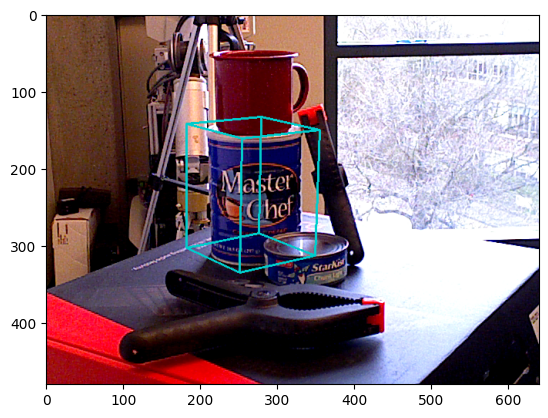

Pose estimation time: 15.352970600128174
R_est: [[-0.77630604  0.6296205   0.03044606]
 [ 0.13183737  0.20940447 -0.96890076]
 [-0.61641532 -0.74814958 -0.24556947]]
t_est: [-39.08805326 -10.51167243 898.70929466]
running k-means on cuda..


[running kmeans]: 8it [00:00, 21.91it/s, center_shift=0.000000, iteration=8, tol=0.000100]


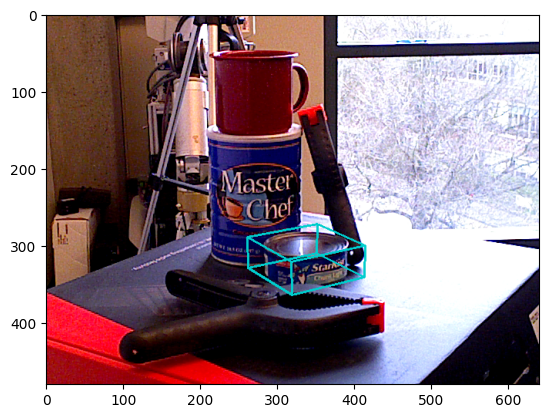

Pose estimation time: 2.041801929473877
R_est: [[-0.85242757  0.52280978 -0.00609675]
 [ 0.14688399  0.2282668  -0.96245486]
 [-0.50178913 -0.82131857 -0.27137331]]
t_est: [ 18.46883035  57.71987878 833.29135313]
running k-means on cuda..


[running kmeans]: 5it [00:00, 21.94it/s, center_shift=0.000000, iteration=5, tol=0.000100]


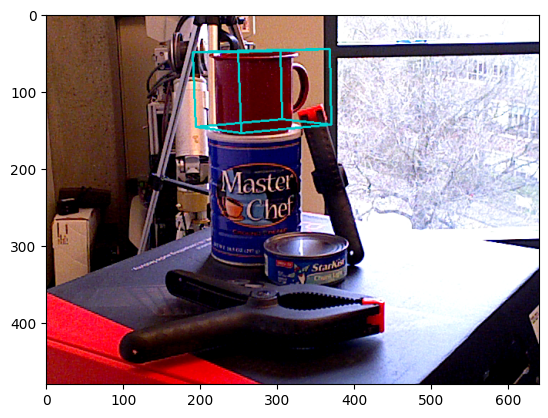

Pose estimation time: 7.272749662399292
R_est: [[ 0.81414238 -0.5801962  -0.02333568]
 [-0.12888224 -0.14137253 -0.98153104]
 [ 0.56618155  0.80211357 -0.18987436]]
t_est: [ -27.18341037 -121.89242746  899.79811561]
running k-means on cuda..


[running kmeans]: 1it [00:00, 333.23it/s, center_shift=0.000000, iteration=1, tol=0.000100]


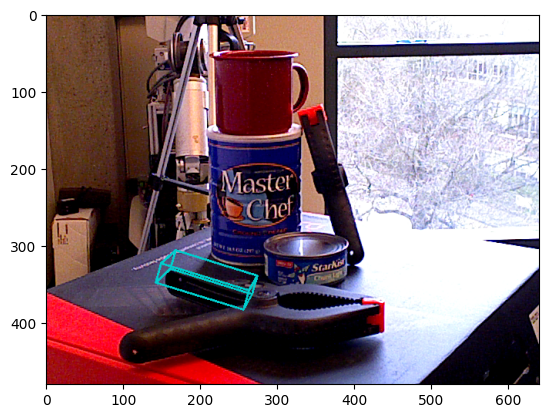

Pose estimation time: 5.182876348495483
R_est: [[ 0.08856131 -0.95623883  0.27886233]
 [-0.13452133 -0.2888796  -0.94786739]
 [ 0.98694524  0.04643145 -0.15421808]]
t_est: [-151.91077076  152.15535775 1583.05356346]
running k-means on cuda..


[running kmeans]: 1it [00:00, 250.17it/s, center_shift=0.000000, iteration=1, tol=0.000100]


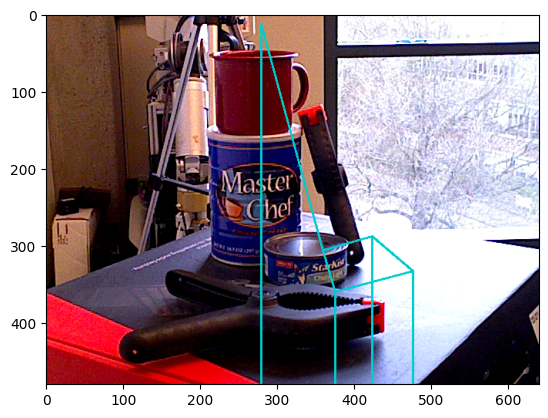

Pose estimation time: 5.339663743972778
R_est: [[-0.01577363  0.26103354  0.96520085]
 [ 0.02962886  0.96501906 -0.26050017]
 [-0.9994365   0.02448877 -0.02295598]]
t_est: [ 19.48952402 -45.59545189 473.18891257]


In [2]:
import cv2
from PIL import Image
import pose_utils.img_utils as img_utils
import pose_utils.vis_utils as vis_utils
import numpy as np
import time
import matplotlib.pyplot as plt

# Loading a ground truth file to access segmentation masks to test zs6d:
with open(os.path.join(config['gt_path']), 'r') as f:
    data_gt = json.load(f)

print(data_gt)
img_id = '000048_1'
# img_id = '8'



for i in range(len(data_gt[img_id])):
    obj_number = i
    obj_id = data_gt[img_id][obj_number]['obj_id']
    cam_K = np.array(data_gt[img_id][obj_number]['cam_K']).reshape((3,3))
    bbox = data_gt[img_id][obj_number]['bbox_visib']

    img_path = os.path.join(config['dataset_path'], data_gt[img_id][obj_number]['img_name'].split("./")[-1])
    img = Image.open(img_path)

    mask = data_gt[img_id][obj_number]['mask_sam']
    mask = img_utils.rle_to_mask(mask)
    mask = mask.astype(np.uint8)

    start_time = time.time()
    
    # To estimate the objects Rotation R and translation t the input image, the object_id, a segmentation mask and camera matrix are necessary
    R_est, t_est = pose_estimator.get_pose(img, str(obj_id), mask, cam_K, bbox=None)

    end_time = time.time()
    
    out_img = vis_utils.draw_3D_bbox_on_image(np.array(img), R_est, t_est, cam_K, data_gt[img_id][obj_number]['model_info'], factor=1.0)

    plt.imshow(out_img)
    plt.show()
    print(f"Pose estimation time: {end_time-start_time}")
    print(f"R_est: {R_est}")
    print(f"t_est: {t_est}")


